# Miscellaneous set up

Load some packages

In [1]:
import datetime
import pandas as pd
import numpy as np

from pandas.tseries.holiday import USFederalHolidayCalendar
holiday_cal = USFederalHolidayCalendar()

from matplotlib import pyplot as plt
import seaborn as sns

import pymmwr

Functions to load data in standardized formats

In [2]:
def date_to_ew_str(row):
    ew = pymmwr.date_to_epiweek(datetime.date.fromisoformat(row['wk_end_date']))
    # ew_str = pd.Series(str(ew.year) + str(ew.week))
    ew_str = str(ew.year) + str(ew.week)
    return ew_str



# convert epi week to season week
def convert_epiweek_to_season_week(epiweek):
  """Convert season and epiweek to season and season week.
  Args:
      epiweek in format 'yyyyww'
  Return:
      season_week: integer between 1 and 52
  """
  epiweek_year = epiweek.str[:4].astype(int)
  epiweek_week = epiweek.str[4:].astype(int)
  
  season_week = epiweek_week - 30

  update_inds = (season_week <= 0)
  season_week[update_inds] = season_week[update_inds] + \
    [pymmwr.epiweeks_in_year(int(epiweek_year[update_inds].values[i]) - 1) for i in range(np.sum(update_inds))]
  
  return season_week



def convert_epiweek_to_season(epiweek):
  """Convert season and epiweek to season and season week.
  Args:
      epiweek in format 'yyyyww'
  Return:
      season: string in format '2018/19'
  """
  epiweek_year = epiweek.str[:4].astype(int)
  epiweek_week = epiweek.str[4:].astype(int)
  
  update_inds = (epiweek_week <= 30)
  epiweek_year = epiweek_year - update_inds
  season = epiweek_year.astype(str)
  season = season + '/' + (season.str[-2:].astype(int) + 1).astype(str)
  
  return season



def load_flusurv_rates_2022_23():
    dat = pd.read_csv('../../data-raw/influenza-flusurv/flusurv-rates/flusurv-rates-2022-23.csv',
                  encoding='ISO-8859-1',
                  engine='python')
    dat.columns = dat.columns.str.lower()

    dat = dat.loc[(dat['age category'] == 'Overall') &
                  (dat['sex category'] == 'Overall') &
                  (dat['race category'] == 'Overall')]
    
    dat = dat.loc[~((dat.catchment == 'Entire Network') &
                    (dat.network != "FluSurv-NET"))]

    dat['location'] = dat['catchment']
    dat['agg_level'] = np.where(dat['location'] == 'Entire Network', 'national', 'site')
    dat['season'] = dat['year'].str.replace('-', '/')
    epiweek = dat['mmwr-year'].astype(str) + dat['mmwr-week'].astype(str)
    dat['season_week'] = convert_epiweek_to_season_week(epiweek)
    dat['wk_end_date'] = dat.apply(
        lambda x: pymmwr.epiweek_to_date(pymmwr.Epiweek(year=x['mmwr-year'],
                                                        week=x['mmwr-week'],
                                                        day=7))
                                            .strftime("%Y-%m-%d"),
        axis=1)
    dat['wk_end_date'] = pd.to_datetime(dat['wk_end_date'])
    dat['inc'] = dat['weekly rate ']
    dat = dat[['agg_level', 'location', 'season', 'season_week', 'wk_end_date', 'inc']]
    
    return dat



def load_flusurv_rates_base(seasons=None,
                            locations=['California', 'Colorado', 'Connecticut', 'Entire Network',
                                      'Georgia', 'Maryland', 'Michigan', 'Minnesota', 'New Mexico',
                                      'New York - Albany', 'New York - Rochester', 'Ohio', 'Oregon',
                                      'Tennessee', 'Utah'],
                            age_labels=['0-4 yr', '5-17 yr', '18-49 yr', '50-64 yr', '65+ yr', 'Overall']
                            ):
  # read flusurv data and do some minimal preprocessing
  dat = pd.read_csv('../../data-raw/influenza-flusurv/flusurv-rates/old-flusurv-rates.csv',
                    encoding='ISO-8859-1',
                    engine='python')
  dat.columns = dat.columns.str.lower()
  dat['season'] = dat.sea_label.str.replace('-', '/')
  dat['inc'] = dat.weeklyrate
  dat['location'] = dat['region']
  dat['agg_level'] = np.where(dat['location'] == 'Entire Network', 'national', 'site')
  dat = dat[(dat.age_label.isin(age_labels)) & (dat.location.isin(locations))]
  if seasons is not None:
    dat = dat[dat.season.isin(seasons)]
  
  dat = dat.sort_values(by=['wk_end'])
  
  dat['wk_end_date'] = pd.to_datetime(dat['wk_end'])
  dat = dat[['agg_level', 'location', 'season', 'season_week', 'wk_end_date', 'inc']]
  
  dat = pd.concat(
    [dat, load_flusurv_rates_2022_23()],
    axis = 0
  )

  dat['source'] = 'flusurvnet'
  
  return dat


def load_one_us_census_file(f):
  dat = pd.read_csv(f, engine='python', dtype={'STATE': str})
  dat = dat.loc[(dat['NAME'] == 'United States') | (dat['STATE'] != '00'),
                (dat.columns == 'STATE') | (dat.columns.str.startswith('POPESTIMATE'))]
  dat = dat.melt(id_vars = 'STATE', var_name='season', value_name='pop')
  dat.rename(columns={'STATE': 'location'}, inplace=True)
  dat.loc[dat['location'] == '00', 'location'] = 'US'
  dat['season'] = dat['season'].str[-4:]
  dat['season'] = dat['season'] + '/' + (dat['season'].str[-2:].astype(int) + 1).astype(str)
  
  return dat


def load_us_census():
  files = [
    '../../data-raw/us-census/nst-est2019-alldata.csv',
    '../../data-raw/us-census/NST-EST2022-ALLDATA.csv']
  dat = pd.concat([load_one_us_census_file(f) for f in files], axis=0)
  
  return dat


def load_hosp_burden():
  burden_estimates = pd.read_csv(
    '../../data-raw/burden-estimates/burden-estimates.csv',
    engine='python')

  burden_estimates.columns = ['season', 'hosp_burden']

  #burden_estimates['hosp_burden'] = burden_estimates['hosp_burden'].astype(int)

  burden_estimates['season'] = burden_estimates['season'].str[:4] + '/' + burden_estimates['season'].str[7:9]

  return burden_estimates


def calc_hosp_burden_adj():
  dat = load_flusurv_rates_base(
    seasons = ['20' + str(yy) + '/' + str(yy+1) for yy in range(10, 23)],
    locations= ['Entire Network'],
    age_labels = ['Overall']
  )

  burden_adj = dat[dat.location == 'Entire Network'] \
    .groupby('season')['inc'] \
    .sum()
  burden_adj = burden_adj.reset_index()
  burden_adj.columns = ['season', 'cum_rate']

  us_census = load_us_census().query("location == 'US'").drop('location', axis=1)
  burden_adj = pd.merge(burden_adj, us_census, on='season')

  burden_estimates = load_hosp_burden()
  burden_adj = pd.merge(burden_adj, burden_estimates, on='season')

  burden_adj['reported_burden_est'] = burden_adj['cum_rate'] * burden_adj['pop'] / 100000
  burden_adj['adj_factor'] = burden_adj['hosp_burden'] / burden_adj['reported_burden_est']

  return burden_adj


def fill_missing_flusurv_dates_one_location(location_df):
  df = location_df.set_index('wk_end_date') \
    .asfreq('W-sat') \
    .reset_index()
  fill_cols = ['agg_level', 'location', 'season', 'pop', 'source']
  df[fill_cols] = df[fill_cols].fillna(axis=0, method='ffill')
  return df


def load_flusurv_rates(burden_adj=True,
                       locations=['California', 'Colorado', 'Connecticut', 'Entire Network',
                                'Georgia', 'Maryland', 'Michigan', 'Minnesota', 'New Mexico',
                                'New York - Albany', 'New York - Rochester', 'Ohio', 'Oregon',
                                'Tennessee', 'Utah']
                       ):
  # read flusurv data and do some minimal preprocessing
  dat = load_flusurv_rates_base(
    seasons = ['20' + str(yy) + '/' + str(yy+1) for yy in range(10, 23)],
    locations = locations,
    age_labels = ['Overall']
  )
  
  # if requested, make adjustments for overall season burden
  if burden_adj:
    hosp_burden_adj = calc_hosp_burden_adj()
    dat = pd.merge(dat, hosp_burden_adj, on='season')
    dat['inc'] = dat['inc'] * dat['adj_factor']
  
  # fill in missing dates
  gd = dat.groupby('location')
  
  dat = pd.concat(
    [fill_missing_flusurv_dates_one_location(df) for _, df in gd],
    axis = 0)
  dat = dat[['agg_level', 'location', 'season', 'season_week', 'wk_end_date', 'inc', 'source']]
  
  return dat


def load_who_nrevss_positive():
  dat = pd.read_csv('../../data-raw/influenza-who-nrevss/who-nrevss.csv',
                    encoding='ISO-8859-1',
                    engine='python')
  dat = dat[['region_type', 'region', 'year', 'week', 'season', 'season_week', 'percent_positive']]
  
  dat.rename(columns={'region_type': 'agg_level', 'region': 'location'},
             inplace=True)
  dat['agg_level'] = np.where(dat['agg_level'] == 'National',
                              'national',
                              dat['agg_level'].str[:-1].str.lower())
  return dat


def load_ilinet(response_type='rate',
                scale_to_positive=True,
                drop_pandemic_seasons=True,
                burden_adj=False):
  # read ilinet data and do some minimal preprocessing
  files = ['../../data-raw/influenza-ilinet/ilinet.csv',
           '../../data-raw/influenza-ilinet/ilinet_hhs.csv',
           '../../data-raw/influenza-ilinet/ilinet_state.csv']
  dat = pd.concat(
    [ pd.read_csv(f, encoding='ISO-8859-1', engine='python') for f in files ],
    axis = 0)
  
  if response_type == 'rate':
    dat['inc'] = np.where(dat['region_type'] == 'States',
                          dat['unweighted_ili'],
                          dat['weighted_ili'])
  else:
    dat['inc'] = dat.ilitotal

  dat['wk_end_date'] = pd.to_datetime(dat['week_start']) + pd.Timedelta(6, 'days')
  dat = dat[['region_type', 'region', 'year', 'week', 'season', 'season_week', 'wk_end_date', 'inc']]
  
  dat.rename(columns={'region_type': 'agg_level', 'region': 'location'},
             inplace=True)
  dat['agg_level'] = np.where(dat['agg_level'] == 'National',
                              'national',
                              dat['agg_level'].str[:-1].str.lower())
  dat = dat.sort_values(by=['season', 'season_week'])
  
  # for early seasons, drop out-of-season weeks with no reporting
  early_seasons = [str(yyyy) + '/' + str(yyyy + 1)[2:] for yyyy in range(1997, 2002)]
  early_in_season_weeks = [w for w in range(10, 43)]
  first_report_season = ['2002/03']
  first_report_in_season_weeks = [w for w in range(10, 53)]
  dat = dat[
    (dat.season.isin(early_seasons) & dat.season_week.isin(early_in_season_weeks)) |
    (dat.season.isin(first_report_season) & dat.season_week.isin(first_report_in_season_weeks)) |
    (~dat.season.isin(early_seasons + first_report_season))]
  
  # region 10 data prior to 2010/11 is bad, drop it
  dat = dat[
    ~((dat['location'] == 'Region 10') & (dat['season'] < '2010/11'))
  ]
  
  if scale_to_positive:
    dat = pd.merge(
      left=dat,
      right=load_who_nrevss_positive(),
      how='left',
      on=['agg_level', 'location', 'season', 'season_week'])
    dat['inc'] = dat['inc'] * dat['percent_positive'] / 100.0
    dat.drop('percent_positive', axis=1)

  if drop_pandemic_seasons:
    dat.loc[dat['season'].isin(['2008/09', '2009/10', '2020/21', '2021/22']), 'inc'] = np.nan

  # if requested, make adjustments for overall season burden
  # if burden_adj:
  #   hosp_burden_adj = calc_hosp_burden_adj()
  #   dat = pd.merge(dat, hosp_burden_adj, on='season')
  #   dat['inc'] = dat['inc'] * dat['adj_factor']

  dat = dat[['agg_level', 'location', 'season', 'season_week', 'wk_end_date', 'inc']]
  dat['source'] = 'ilinet'
  return dat



def load_hhs(rates=True):
  dat = pd.read_csv("../../data-raw/influenza-hhs/hhs.csv")
  dat.rename(columns={'date': 'wk_end_date'}, inplace=True)

  ew_str = dat.apply(date_to_ew_str, axis=1)
  dat['season'] = convert_epiweek_to_season(ew_str)
  dat['season_week'] = convert_epiweek_to_season_week(ew_str)
  dat = dat.sort_values(by=['season', 'season_week'])
  
  if rates:
    pops = load_us_census()
    dat = dat.merge(pops, on = ['location', 'season'], how='left') \
      .assign(inc=lambda x: x['inc'] / x['pop'] * 100000)

  dat['wk_end_date'] = pd.to_datetime(dat['wk_end_date'])
  
  dat['agg_level'] = np.where(dat['location'] == 'US', 'national', 'state')
  dat = dat[['agg_level', 'location', 'season', 'season_week', 'wk_end_date', 'inc']]
  dat['source'] = 'hhs'
  return dat

In [3]:
load_us_census()

,location,season,pop
0,US,2010/11,309321666
1,01,2010/11,4785437
2,02,2010/11,713910
3,04,2010/11,6407172
4,05,2010/11,2921964
...,...,...,...
154,53,2022/23,7785786
155,54,2022/23,1775156
156,55,2022/23,5892539
157,56,2022/23,581381


In [4]:
load_flusurv_rates_base()['season'].unique()

array(['2009/10', '2010/11', '2011/12', '2012/13', '2013/14', '2014/15',
       '2015/16', '2016/17', '2017/18', '2018/19', '2019/20', '2022/23'],
      dtype=object)

# Influenza Data from the US from Flusurv-NET

We examine estimates of influenza hospitalization rates per 100,000 population from the Flusurv-NET data.

Here we attempt to adjust for the possibility of changing testing practices in the reporting system over time using external estimates of influenza season size that account for the proportion of individuals with upper respiratory infections that were tested in each facility and season, and the sensitivity of the tests that were used.

The table below shows:

 - `cum_rate`: the directly reported cumulative hospitalization rate per 100,000 population over the course of the full season, at the national level
 - `pop`: US Census estimate of population size as of July 1 in the first year of the season
 - `hosp_burden`: An external estimate of hospital burden from CDC
 - `reported_burden_est`: Calculated as `cum_rate * pop / 100000`
 - `adj_factor`: Calculated as `hosp_burden / reported_burden_est`

Compare to the multiplicative adjustment factors in table 1 [here](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0118369); we seem to be roughly in the right range.

In [5]:
calc_hosp_burden_adj()

,season,cum_rate,pop,hosp_burden,reported_burden_est,adj_factor
0,2010/11,21.7,309321666,290000.0,67122.801522,4.320439
1,2011/12,8.6,311556874,140000.0,26793.891164,5.225072
2,2012/13,44.0,313830990,570000.0,138085.635600,4.127873
3,2013/14,35.2,315993715,350000.0,111229.787680,3.146639
4,2014/15,64.0,318301008,590000.0,203712.645120,2.896237
5,2015/16,31.5,320635163,280000.0,101000.076345,2.772275
6,2016/17,62.0,322941311,500000.0,200223.612820,2.497208
7,2017/18,102.7,324985539,710000.0,333760.148553,2.127276
8,2018/19,63.5,326687501,380000.0,207446.563135,1.831797
9,2019/20,65.7,328239523,390000.0,215653.366611,1.808458


In [6]:
flusurv_dat = load_flusurv_rates()
flusurv_dat

,agg_level,location,season,season_week,wk_end_date,inc,source
0,site,California,2010/11,10.0,2010-10-09,0.432044,flusurvnet
1,site,California,2010/11,11.0,2010-10-16,0.432044,flusurvnet
2,site,California,2010/11,12.0,2010-10-23,0.000000,flusurvnet
3,site,California,2010/11,13.0,2010-10-30,0.432044,flusurvnet
4,site,California,2010/11,14.0,2010-11-06,0.000000,flusurvnet
...,...,...,...,...,...,...,...
651,site,Utah,2022/23,35.0,2023-04-01,0.000000,flusurvnet
652,site,Utah,2022/23,36.0,2023-04-08,0.685190,flusurvnet
653,site,Utah,2022/23,37.0,2023-04-15,0.685190,flusurvnet
654,site,Utah,2022/23,38.0,2023-04-22,0.913587,flusurvnet


In [7]:
flusurv_dat[['agg_level', 'location']].drop_duplicates()

,agg_level,location
0,site,California
0,site,Colorado
0,site,Connecticut
0,national,Entire Network
0,site,Georgia
0,site,Maryland
0,site,Michigan
0,site,Minnesota
0,site,New Mexico
0,site,New York - Albany


In [8]:
flusurv_dat.iloc[20:50]

,agg_level,location,season,season_week,wk_end_date,inc,source
20,site,California,2010/11,30.0,2011-02-26,7.776791,flusurvnet
21,site,California,2010/11,31.0,2011-03-05,10.369055,flusurvnet
22,site,California,2010/11,32.0,2011-03-12,7.776791,flusurvnet
23,site,California,2010/11,33.0,2011-03-19,5.616571,flusurvnet
24,site,California,2010/11,34.0,2011-03-26,3.888396,flusurvnet
25,site,California,2010/11,35.0,2011-04-02,2.592264,flusurvnet
26,site,California,2010/11,36.0,2011-04-09,1.296132,flusurvnet
27,site,California,2010/11,37.0,2011-04-16,0.432044,flusurvnet
28,site,California,2010/11,38.0,2011-04-23,0.864088,flusurvnet
29,site,California,2010/11,39.0,2011-04-30,0.432044,flusurvnet


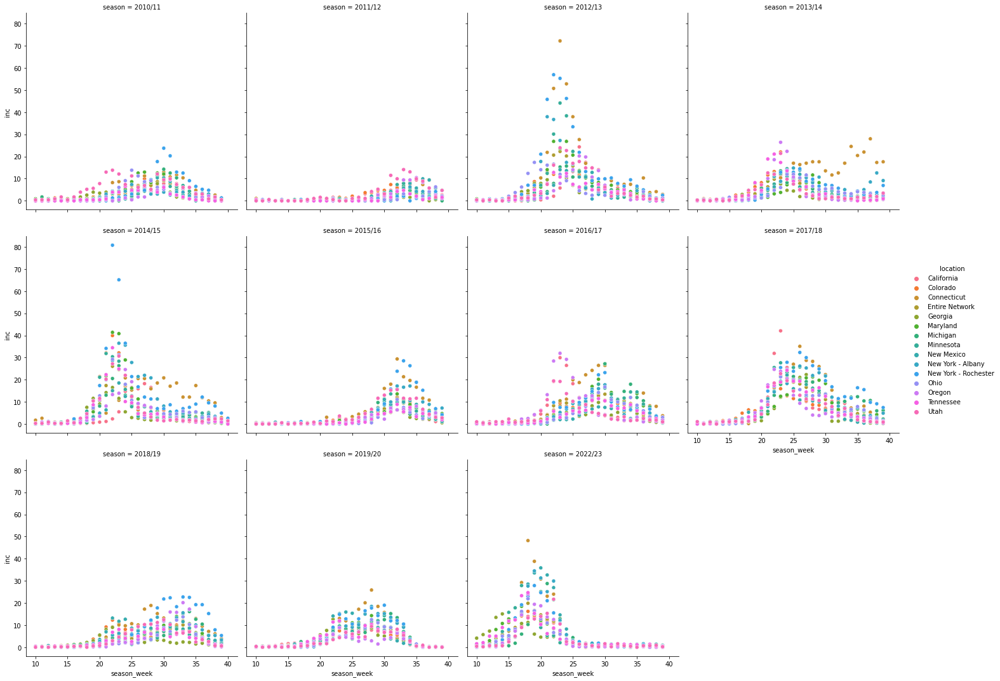

In [9]:
sns.relplot(x='season_week', y='inc', hue='location', col='season', col_wrap=4, data=flusurv_dat)

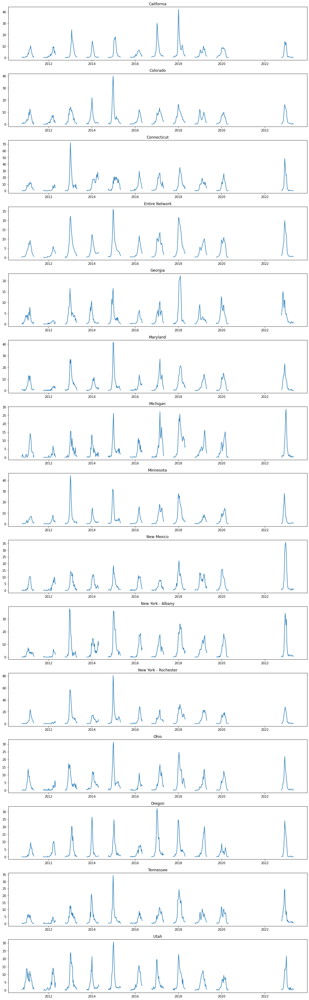

In [10]:
n_locations = len(flusurv_dat['location'].unique())
fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(flusurv_dat['location'].unique()):
  location_dat = flusurv_dat.loc[flusurv_dat['location'] == location]
  ax[i].plot(location_dat['wk_end_date'], location_dat['inc'])
  ax[i].set_title(location)

fig.tight_layout()

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/var/folders/xs/t5qwsz_d0hlc6vkx6wzr98f5q78pzl/T/ipykernel_4860/1195574394.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  location_dat['inc_trans'] = location_dat['inc']**0.25
/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

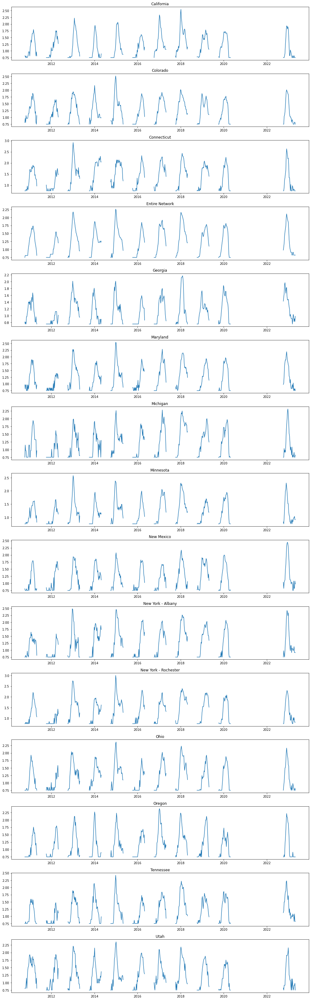

In [11]:
# same thing, but:
# - replace 0 with 0.75^4
# - take log
# - calculate estimate of first derivative based on rolling trailing window of 3, 5, 7 weeks
n_locations = len(flusurv_dat['location'].unique())
fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(flusurv_dat['location'].unique()):
  location_dat = flusurv_dat.loc[flusurv_dat['location'] == location]
  location_dat.loc[location_dat['inc'] < 0.75**4, 'inc'] = 0.75**4
  location_dat.loc[(location_dat['season_week'] < 10) | (location_dat['season_week'] > 45), 'inc'] = np.nan
  location_dat['inc_trans'] = location_dat['inc']**0.25
#   location_dat['inc_trans'] = np.log(location_dat['inc'])
  ax[i].plot(location_dat['wk_end_date'], location_dat['inc_trans'])
  ax[i].set_title(location)

fig.tight_layout()


# ILINet and WHO/NREVSS Virology data

Here we conduct a similar analysis as above, but obtaining measures of influenza prevalence from the ILINet system and using virology testing data from WHO/NREVSS to construct a proxy measure of incidence due to influenza A/H1, A/H3, and B. The ILINet data give us two measures of the prevalence of influenza in each week: (1) a proportion of outpatient doctor visits where the patient has symptoms consistent with influenza-like illness, and (2) a count of the number of outpatient doctor visits where the patient has symptoms consistent with influenza-like illness. When calculating the proportion, rates are weighted by state population when aggregating to the national level. These population-adjusted rates are perhaps a better summary of the national level signal, but it appears that Goldstein et al. analyzed the counts. We examine each signal in turn.

## ILINet rates

Here is a plot of the raw ILInet data at the national level, by season.

In [12]:
ilinet_dat = load_ilinet()
ilinet_dat

,agg_level,location,season,season_week,wk_end_date,inc,source
0,national,National,1997/98,10,1997-10-04,0.0,ilinet
1,hhs region,Region 1,1997/98,10,1997-10-04,0.0,ilinet
2,hhs region,Region 2,1997/98,10,1997-10-04,0.0,ilinet
3,hhs region,Region 3,1997/98,10,1997-10-04,0.0,ilinet
4,hhs region,Region 4,1997/98,10,1997-10-04,0.0,ilinet
...,...,...,...,...,...,...,...
49828,state,Wyoming,2023/24,8,2023-09-23,NaN,ilinet
49829,state,Commonwealth of the Northern Mariana Islands,2023/24,8,2023-09-23,NaN,ilinet
49830,state,Puerto Rico,2023/24,8,2023-09-23,0.0,ilinet
49831,state,Virgin Islands,2023/24,8,2023-09-23,NaN,ilinet


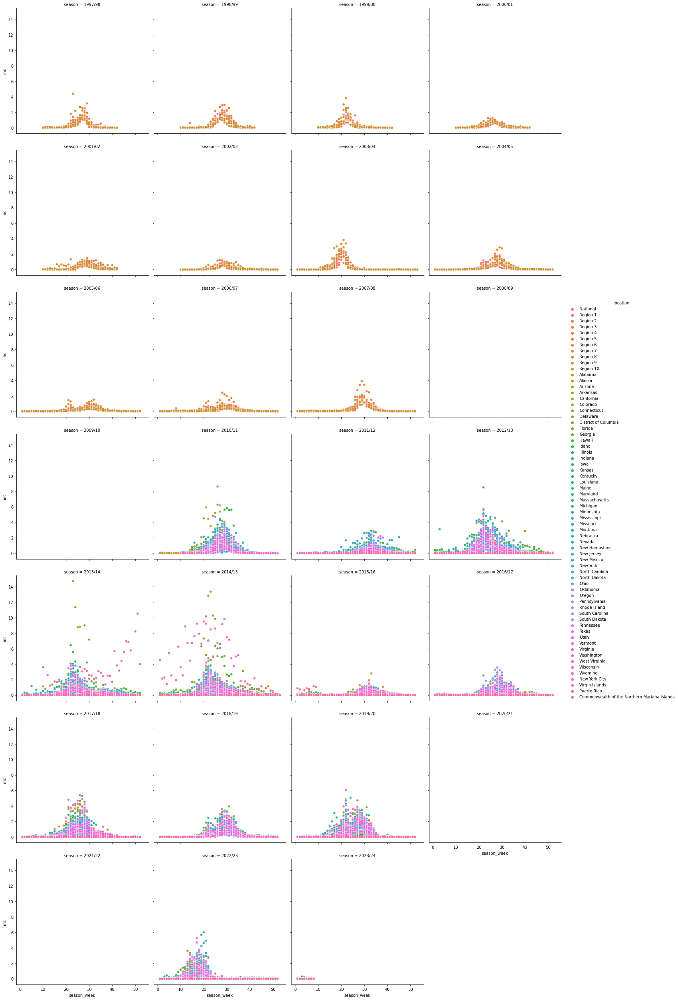

In [13]:
sns.relplot(x='season_week', y='inc', hue='location', col='season', col_wrap=4, data=ilinet_dat)

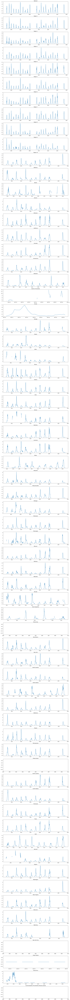

In [14]:
n_locations = len(ilinet_dat['location'].unique())
fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(ilinet_dat['location'].unique()):
  location_dat = ilinet_dat.loc[ilinet_dat['location'] == location] \
    .set_index('wk_end_date') \
    .asfreq('W-sat') \
    .reset_index()
  location_dat.loc[(location_dat['season_week'] < 10) | (location_dat['season_week'] > 45), 'inc'] = np.nan
  ax[i].plot(location_dat['wk_end_date'], location_dat['inc'])
  ax[i].set_title(location)

fig.tight_layout()

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/var/folders/xs/t5qwsz_d0hlc6vkx6wzr98f5q78pzl/T/ipykernel_4860/1499513311.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  location_dat['inc_trans'] = location_dat['inc']**0.25
/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

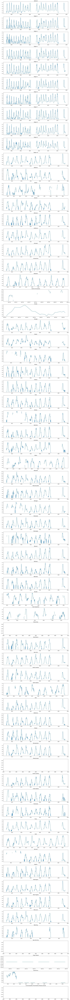

In [15]:
# same thing, but:
# - replace 0 with 0.75^4
# - take log
# - calculate estimate of first derivative based on rolling trailing window of 3, 5, 7 weeks
n_locations = len(ilinet_dat['location'].unique())
fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(ilinet_dat['location'].unique()):
  location_dat = ilinet_dat.loc[ilinet_dat['location'] == location]
  location_dat.loc[location_dat['inc'] < np.exp(-7), 'inc'] = np.exp(-7)
  location_dat.loc[(location_dat['season_week'] < 10) | (location_dat['season_week'] > 45), 'inc'] = np.nan
  location_dat['inc_trans'] = location_dat['inc']**0.25
#   location_dat['inc_trans'] = np.log(location_dat['inc'])
  ax[i].plot(location_dat['wk_end_date'], location_dat['inc_trans'])
  ax[i].set_title(location)

fig.tight_layout()


# HHS data

In [16]:
hhs_dat = load_hhs()
hhs_dat

,agg_level,location,season,season_week,wk_end_date,inc,source
0,state,01,2022/23,5,2022-09-03,0.413851,hhs
1,state,02,2022/23,5,2022-09-03,0.000000,hhs
2,state,04,2022/23,5,2022-09-03,0.217415,hhs
3,state,05,2022/23,5,2022-09-03,0.262671,hhs
4,state,06,2022/23,5,2022-09-03,0.089676,hhs
...,...,...,...,...,...,...,...
2961,state,55,2023/24,6,2023-09-09,NaN,hhs
2962,state,56,2023/24,6,2023-09-09,NaN,hhs
2963,state,72,2023/24,6,2023-09-09,NaN,hhs
2964,state,78,2023/24,6,2023-09-09,NaN,hhs


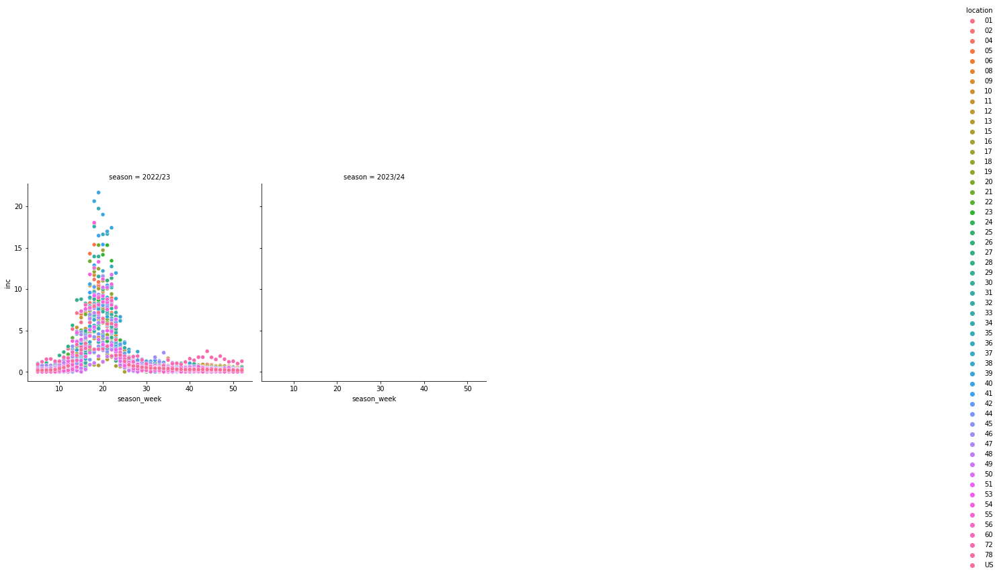

In [17]:
sns.relplot(x='season_week', y='inc', hue='location', col='season', col_wrap=4, data=hhs_dat)

In [18]:
hhs_dat = hhs_dat.merge(
    pd.read_csv('../../data-raw/fips-mappings/fips_mappings.csv'),
    on='location')

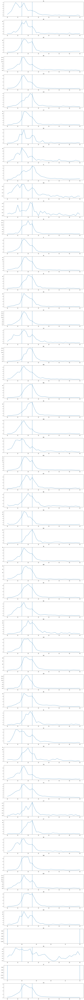

In [19]:
n_locations = len(hhs_dat['abbreviation'].unique())
fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(hhs_dat['abbreviation'].unique()):
    location_dat = hhs_dat.loc[hhs_dat['abbreviation'] == location] \
        .set_index('wk_end_date') \
        .asfreq('W-sat') \
        .reset_index()
    location_dat.loc[(location_dat['season_week'] < 10) | (location_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(location_dat['season_week'], location_dat['inc'])

    hol = holiday_cal.holidays(
        start=location_dat.wk_end_date.min(),
        end=location_dat.wk_end_date.max(),
        return_name=True)
    
    for hol_name in ['Thanksgiving', 'Christmas']:
        hol_date = hol[hol == hol_name].index[0]
        hol_week = location_dat.loc[location_dat['wk_end_date'] >= hol_date].head(1)['season_week'].values[0]
        ax[i].axvline(hol_week)

    ax[i].set_title(location)

fig.tight_layout()

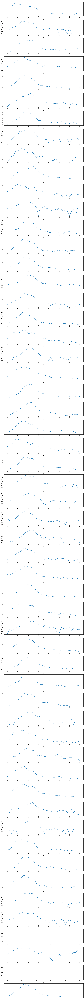

In [20]:
n_locations = len(hhs_dat['abbreviation'].unique())
fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(hhs_dat['abbreviation'].unique()):
    location_dat = hhs_dat.loc[hhs_dat['abbreviation'] == location] \
        .set_index('wk_end_date') \
        .asfreq('W-sat') \
        .reset_index()
    location_dat.loc[location_dat['inc'] < np.exp(-7), 'inc'] = np.exp(-7)
    location_dat.loc[(location_dat['season_week'] < 10) | (location_dat['season_week'] > 45), 'inc'] = np.nan
    location_dat['inc_trans'] = location_dat['inc']**0.25
    # location_dat.loc[(location_dat['season_week'] < 10) | (location_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(location_dat['season_week'], location_dat['inc_trans'])

    hol = holiday_cal.holidays(
        start=location_dat.wk_end_date.min(),
        end=location_dat.wk_end_date.max(),
        return_name=True)
    
    for hol_name in ['Thanksgiving', 'Christmas']:
        hol_date = hol[hol == hol_name].index[0]
        hol_week = location_dat.loc[location_dat['wk_end_date'] >= hol_date].head(1)['season_week'].values[0]
        ax[i].axvline(hol_week)

    ax[i].set_title(location)

fig.tight_layout()

In [20]:
max_inc_by_loc = hhs_dat.loc[~np.isnan(hhs_dat['inc'])] \
    .sort_values('inc') \
    .groupby('location') \
    .tail(1)# \
    # .merge(
    #     pd.read_csv('../../data-raw/fips-mappings/fips_mappings.csv'),
    #     left_on='location', right_on='location'
    # )

max_inc_by_loc

,agg_level,location,season,season_week,wk_end_date,inc,source,abbreviation,location_name,hhs_region
610,state,15,2022/23,21,2022-12-24,2.152485,hhs,HI,Hawaii,9.0
553,state,13,2022/23,18,2022-12-03,2.309199,hhs,GA,Georgia,4.0
2393,state,49,2022/23,22,2022-12-31,2.662092,hhs,UT,Utah,8.0
2813,state,72,2022/23,14,2022-11-05,3.290098,hhs,PR,Puerto Rico,2.0
2169,state,45,2022/23,14,2022-11-05,4.883927,hhs,SC,South Carolina,4.0
2497,state,51,2022/23,18,2022-12-03,5.400974,hhs,VA,Virginia,3.0
1795,state,37,2022/23,18,2022-12-03,5.608015,hhs,NC,North Carolina,4.0
2122,state,44,2022/23,21,2022-12-24,5.668654,hhs,RI,Rhode Island,1.0
503,state,12,2022/23,22,2022-12-31,5.830570,hhs,FL,Florida,4.0
286,state,08,2022/23,21,2022-12-24,5.993227,hhs,CO,Colorado,8.0


In [21]:
import plotly.express as px
fig = px.choropleth(
    locations=max_inc_by_loc['abbreviation'],
    locationmode="USA-states",
    color=max_inc_by_loc['inc'],
    scope="usa")
fig.show()

In [22]:
fig = px.choropleth(
    locations=max_inc_by_loc['abbreviation'],
    locationmode="USA-states",
    color=max_inc_by_loc['season_week'],
    scope="usa")
fig.show()

In [23]:
max_inc_by_season_loc = ilinet_dat.loc[(~np.isnan(ilinet_dat['inc'])) &
                                       (ilinet_dat['season'] != '2023/24') &
                                       (ilinet_dat['location'] != 'National') &
                                       (ilinet_dat['agg_level'] == 'hhs region')] \
    .sort_values('inc') \
    .groupby(['season', 'location']) \
    .tail(1) \
    .merge(
        pd.read_csv('../../data-raw/fips-mappings/fips_mappings.csv') \
            .query("location != 'US'") \
            .assign(hhs_region=lambda x: 'Region ' + x['hhs_region'].astype(int).astype(str)),
        left_on='location', right_on='hhs_region',
        how = 'outer'
    ) \
    .sort_values('season')

max_inc_by_season_loc

,agg_level,location_x,season,season_week,wk_end_date,inc,source,abbreviation,location_y,location_name,hhs_region
517,hhs region,Region 8,1997/98,26,1998-01-24,2.677191,ilinet,MT,30,Montana,Region 8
788,hhs region,Region 9,1997/98,23,1998-01-03,4.393637,ilinet,AS,60,American Samoa,Region 9
1191,hhs region,Region 5,1997/98,28,1998-02-07,2.495622,ilinet,WI,55,Wisconsin,Region 5
1189,hhs region,Region 5,1997/98,28,1998-02-07,2.495622,ilinet,MN,27,Minnesota,Region 5
1188,hhs region,Region 5,1997/98,28,1998-02-07,2.495622,ilinet,MI,26,Michigan,Region 5
...,...,...,...,...,...,...,...,...,...,...,...
1171,hhs region,Region 5,2022/23,19,2022-12-10,1.924847,ilinet,MN,27,Minnesota,Region 5
1172,hhs region,Region 5,2022/23,19,2022-12-10,1.924847,ilinet,OH,39,Ohio,Region 5
1173,hhs region,Region 5,2022/23,19,2022-12-10,1.924847,ilinet,WI,55,Wisconsin,Region 5
1011,hhs region,Region 6,2022/23,17,2022-11-26,2.275946,ilinet,OK,40,Oklahoma,Region 6


In [24]:
fig = px.choropleth(
    locations=max_inc_by_season_loc['abbreviation'],
    locationmode="USA-states",
    color=max_inc_by_season_loc['inc'],
    facet_col = max_inc_by_season_loc['season'],
    facet_col_wrap=4,
    scope="usa",
    height=1000)
fig.show()

In [25]:
fig = px.choropleth(
    locations=max_inc_by_season_loc['abbreviation'],
    locationmode="USA-states",
    color=max_inc_by_season_loc['season_week'],
    facet_col = max_inc_by_season_loc['season'],
    facet_col_wrap=4,
    scope="usa",
    height=1000,
    title="season timing (color is peak week of season)")
fig.show()

# Mutiple data sets

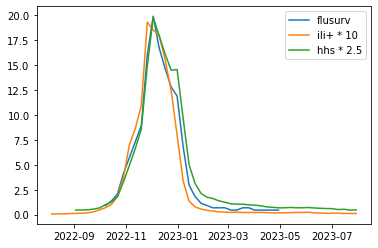

In [26]:
flusurv_nat_2022_23 = flusurv_dat.query("location == 'Entire Network' and season == '2022/23'") \
    .drop('source', axis=1)
# flusurv_nat_2022_23.rename(columns={'inc': 'flusurvnet'}, inplace=True)

ilinet_nat_2022_23 = ilinet_dat.query("location == 'National' and season == '2022/23'") \
    .drop('source', axis=1)
# ilinet_nat_2022_23.rename(columns={'inc': 'ilinet'}, inplace=True)

hhs_nat_2022_23 = hhs_dat.query("location == 'US' and season == '2022/23'") \
    .drop('source', axis=1)
# hhs_nat_2022_23.rename(columns={'inc': 'hhs'}, inplace=True)

plt.plot(
    flusurv_nat_2022_23.wk_end_date,
    flusurv_nat_2022_23.inc,
    label = 'flusurv')

plt.plot(
    ilinet_nat_2022_23.wk_end_date,
    ilinet_nat_2022_23.inc * 10.0,
    label = 'ili+ * 10')

plt.plot(
    hhs_nat_2022_23.wk_end_date,
    hhs_nat_2022_23.inc * 2.5,
    label = 'hhs * 2.5')

plt.legend()

In [27]:
hol = holiday_cal.holidays(
    start=flusurv_nat_2022_23.wk_end_date.min(),
    end=flusurv_nat_2022_23.wk_end_date.max(),
    return_name=True)

hol[hol == 'Christmas'].index[0]
hol[hol == 'Thanksgiving'].index[0].date()

datetime.date(2022, 11, 24)

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

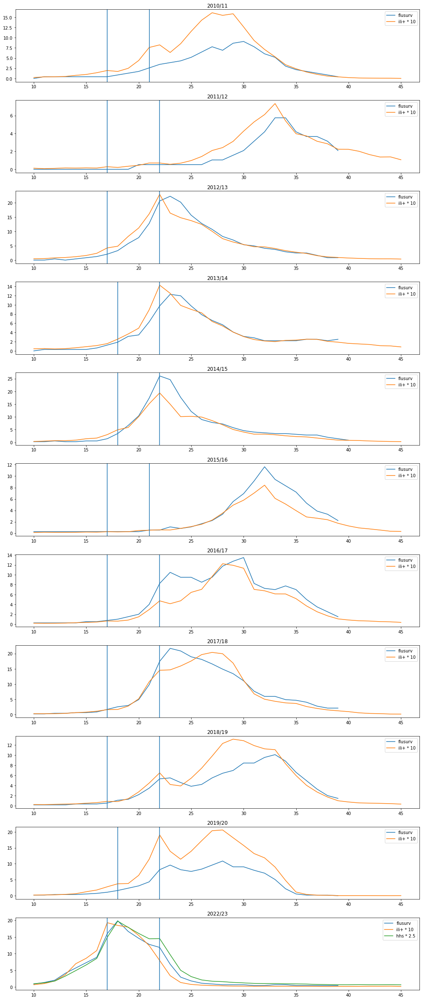

In [28]:
flusurv_nat = flusurv_dat.query("location == 'Entire Network'") \
    .drop('source', axis=1)
# flusurv_nat_2022_23.rename(columns={'inc': 'flusurvnet'}, inplace=True)

ilinet_nat = ilinet_dat.query("location == 'National'") \
    .drop('source', axis=1)


n_seasons = len(flusurv_nat['season'].unique())
fig, ax = plt.subplots(n_seasons, 1, figsize = (14, 3*n_seasons))

for i, season in enumerate(flusurv_nat['season'].unique()):
    season_dat = flusurv_nat.loc[flusurv_nat['season'] == season]
    season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(season_dat['season_week'], season_dat['inc'], label = 'flusurv')
    
    season_dat = ilinet_nat.loc[ilinet_nat['season'] == season]
    season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(season_dat['season_week'], season_dat['inc']*10, label = 'ili+ * 10')
    
    if season == '2022/23':
        season_dat = hhs_dat.loc[(hhs_dat['season'] == season) & (hhs_dat['location'] == 'US')]
        season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
        ax[i].plot(season_dat['season_week'], season_dat['inc']*2.5, label = 'hhs * 2.5')
    
    hol = holiday_cal.holidays(
        start=season_dat.wk_end_date.min(),
        end=season_dat.wk_end_date.max(),
        return_name=True)
    
    for hol_name in ['Thanksgiving', 'Christmas']:
        hol_date = hol[hol == hol_name].index[0]
        hol_week = season_dat.loc[season_dat['wk_end_date'] >= hol_date].head(1)['season_week'].values[0]
        ax[i].axvline(hol_week)
    
    ax[i].set_title(season)
    ax[i].legend()

fig.tight_layout()

# plt.plot(
#     flusurv_nat.wk_end_date,
#     flusurv_nat.inc,
#     label = 'flusurv')

# plt.plot(
#     ilinet_nat.wk_end_date,
#     ilinet_nat.inc * 10.0,
#     label = 'ili+ * 10')

# plt.legend()

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.

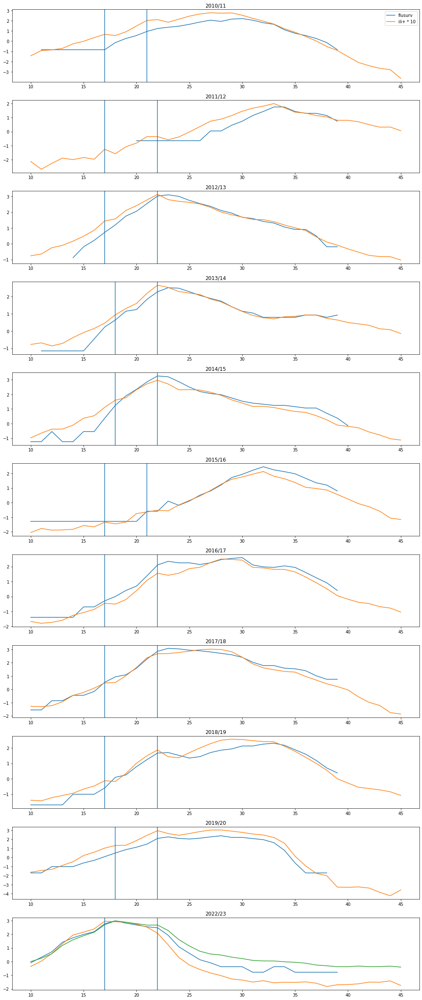

In [30]:
flusurv_nat = flusurv_dat.query("location == 'Entire Network'") \
    .drop('source', axis=1)
# flusurv_nat_2022_23.rename(columns={'inc': 'flusurvnet'}, inplace=True)

ilinet_nat = ilinet_dat.query("location == 'National'") \
    .drop('source', axis=1)


n_seasons = len(flusurv_nat['season'].unique())
fig, ax = plt.subplots(n_seasons, 1, figsize = (14, 3*n_seasons))

for i, season in enumerate(flusurv_nat['season'].unique()):
    season_dat = flusurv_nat.loc[flusurv_nat['season'] == season]
    season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(season_dat['season_week'], np.log(season_dat['inc']), label = 'flusurv')

    season_dat = ilinet_nat.loc[ilinet_nat['season'] == season]
    season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(season_dat['season_week'], np.log(season_dat['inc']*10), label = 'ili+ * 10')

    if season == '2022/23':
        season_dat = hhs_dat.loc[(hhs_dat['season'] == season) & (hhs_dat['location'] == 'US')]
        season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
        ax[i].plot(season_dat['season_week'], np.log(season_dat['inc']*2.5), label = 'hhs * 2.5')
    
    hol = holiday_cal.holidays(
        start=season_dat.wk_end_date.min(),
        end=season_dat.wk_end_date.max(),
        return_name=True)
    
    for hol_name in ['Thanksgiving', 'Christmas']:
        hol_date = hol[hol == hol_name].index[0]
        hol_week = season_dat.loc[season_dat['wk_end_date'] >= hol_date].head(1)['season_week'].values[0]
        ax[i].axvline(hol_week)

    ax[i].set_title(season)

ax[0].legend()
fig.tight_layout()


# Leadingness?

Observation: from above plots, it looks like in general, at the national level, ilinet is leading hospitalizations signals.

Questions: Could we use it as a predictor? Does this leading/lagging relationship look usable at smaller spatial scales?

Note: ilinet and flusurv signals are collected at different spatial scales (ilinet: hhs region; flusurv: some sites covering some states in most but not all regions)

In [31]:
load_us_census()

,location,season,pop
0,US,2010/11,309321666
1,01,2010/11,4785437
2,02,2010/11,713910
3,04,2010/11,6407172
4,05,2010/11,2921964
...,...,...,...
154,53,2022/23,7785786
155,54,2022/23,1775156
156,55,2022/23,5892539
157,56,2022/23,581381


In [32]:
fips_mappings = pd.read_csv('../../data-raw/fips-mappings/fips_mappings.csv')
fips_mappings

,abbreviation,location,location_name,hhs_region
0,US,US,United States,NaN
1,AL,01,Alabama,4.0
2,AK,02,Alaska,10.0
3,AZ,04,Arizona,9.0
4,AR,05,Arkansas,6.0
5,CA,06,California,9.0
6,CO,08,Colorado,8.0
7,CT,09,Connecticut,1.0
8,DE,10,Delaware,3.0
9,DC,11,District of Columbia,3.0


In [33]:
flusurv_dat

,agg_level,location,season,season_week,wk_end_date,inc,source
0,site,California,2010/11,10.0,2010-10-09,0.432044,flusurvnet
1,site,California,2010/11,11.0,2010-10-16,0.432044,flusurvnet
2,site,California,2010/11,12.0,2010-10-23,0.000000,flusurvnet
3,site,California,2010/11,13.0,2010-10-30,0.432044,flusurvnet
4,site,California,2010/11,14.0,2010-11-06,0.000000,flusurvnet
...,...,...,...,...,...,...,...
651,site,Utah,2022/23,35.0,2023-04-01,0.000000,flusurvnet
652,site,Utah,2022/23,36.0,2023-04-08,0.685190,flusurvnet
653,site,Utah,2022/23,37.0,2023-04-15,0.685190,flusurvnet
654,site,Utah,2022/23,38.0,2023-04-22,0.913587,flusurvnet


In [34]:
# aggregate flusurv to hhs regions
flusurv_agg_to_hhs = flusurv_dat \
    .loc[flusurv_dat['location'] != 'Entire Network'] \
    .assign(state = lambda x: np.where(x['location'].isin(['New York - Albany', 'New York - Rochester']),
                                       'New York',
                                       x['location'])) \
    .merge(
        fips_mappings.rename(columns={'location': 'fips'}),
        left_on='state',
        right_on='location_name') \
    .merge(
        load_us_census(),
        left_on = ['fips', 'season'],
        right_on = ['location', 'season'],
        how='left') \
    .assign(
        hhs_region=lambda x: 'Region ' + x['hhs_region'].astype(int).astype(str)) \
    .groupby(['hhs_region', 'season', 'season_week', 'wk_end_date', 'source']) \
    .apply(lambda x: pd.DataFrame({'inc': [np.sum(x['inc'] * x['pop']) / np.sum(x['pop'])]})) \
    .reset_index() \
    .drop(columns = 'level_5') \
    .rename(columns = {'hhs_region': 'location'})

flusurv_agg_to_hhs


,location,season,season_week,wk_end_date,source,inc
0,Region 1,2010/11,10.0,2010-10-09,flusurvnet,0.000000
1,Region 1,2010/11,11.0,2010-10-16,flusurvnet,0.000000
2,Region 1,2010/11,12.0,2010-10-23,flusurvnet,0.000000
3,Region 1,2010/11,13.0,2010-10-30,flusurvnet,0.432044
4,Region 1,2010/11,14.0,2010-11-06,flusurvnet,0.432044
...,...,...,...,...,...,...
2974,Region 9,2022/23,35.0,2023-04-01,flusurvnet,0.228397
2975,Region 9,2022/23,36.0,2023-04-08,flusurvnet,0.456794
2976,Region 9,2022/23,37.0,2023-04-15,flusurvnet,0.228397
2977,Region 9,2022/23,38.0,2023-04-22,flusurvnet,0.228397


/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

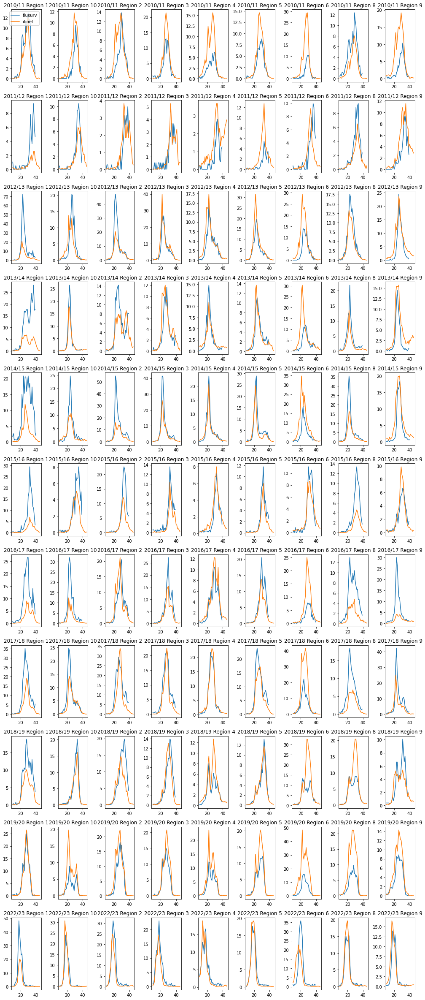

In [35]:
n_seasons = len(flusurv_agg_to_hhs['season'].unique())
n_locations = len(flusurv_agg_to_hhs['location'].unique())

fig, ax = plt.subplots(n_seasons, n_locations, figsize = (14, 3*n_seasons))

for i, season in enumerate(flusurv_agg_to_hhs['season'].unique()):
    flusurv_season_dat = flusurv_agg_to_hhs.loc[flusurv_agg_to_hhs['season'] == season]
    flusurv_season_dat.loc[(flusurv_season_dat['season_week'] < 10) |
                           (flusurv_season_dat['season_week'] > 45), 'inc'] = np.nan
    
    ilinet_season_dat = ilinet_dat.loc[ilinet_dat['season'] == season]
    ilinet_season_dat.loc[(ilinet_season_dat['season_week'] < 10) |
                           (ilinet_season_dat['season_week'] > 45), 'inc'] = np.nan
    
    for j, location in enumerate(flusurv_season_dat['location'].unique()):
        location_dat = flusurv_season_dat.loc[flusurv_season_dat['location'] == location]
        ax[i, j].plot(location_dat['season_week'], location_dat['inc'], label = 'flusurv')
        location_dat = ilinet_season_dat.loc[ilinet_season_dat['location'] == location]
        ax[i, j].plot(location_dat['season_week'], location_dat['inc']*10, label = 'ilinet')
        ax[i, j].set_title(f'{season} {location}')

ax[0,0].legend()
fig.tight_layout()


In [36]:
hhs_dat

,agg_level,location,season,season_week,wk_end_date,inc,source,abbreviation,location_name,hhs_region
0,state,01,2022/23,5,2022-09-03,0.413851,hhs,AL,Alabama,4.0
1,state,01,2022/23,6,2022-09-10,0.216779,hhs,AL,Alabama,4.0
2,state,01,2022/23,7,2022-09-17,0.335022,hhs,AL,Alabama,4.0
3,state,01,2022/23,8,2022-09-24,0.394143,hhs,AL,Alabama,4.0
4,state,01,2022/23,9,2022-10-01,0.472972,hhs,AL,Alabama,4.0
...,...,...,...,...,...,...,...,...,...,...
2961,national,US,2023/24,2,2023-08-12,NaN,hhs,US,United States,NaN
2962,national,US,2023/24,3,2023-08-19,NaN,hhs,US,United States,NaN
2963,national,US,2023/24,4,2023-08-26,NaN,hhs,US,United States,NaN
2964,national,US,2023/24,5,2023-09-02,NaN,hhs,US,United States,NaN


In [37]:
# aggregate hhs protect to hhs regions
hhs_agg_to_hhs = hhs_dat \
    .loc[hhs_dat['location'] != 'US'] \
    .merge(
        load_us_census(),
        left_on = ['location', 'season'],
        right_on = ['location', 'season'],
        how='left') \
    .assign(
        hhs_region=lambda x: 'Region ' + x['hhs_region'].astype(int).astype(str)) \
    .groupby(['hhs_region', 'season', 'season_week', 'wk_end_date', 'source']) \
    .apply(lambda x: pd.DataFrame({'inc': [np.sum(x['inc'] * x['pop']) / np.sum(x['pop'])]})) \
    .reset_index() \
    .drop(columns = 'level_5') \
    .rename(columns = {'hhs_region': 'location'})

hhs_agg_to_hhs


/var/folders/xs/t5qwsz_d0hlc6vkx6wzr98f5q78pzl/T/ipykernel_3779/543007582.py:12: RuntimeWarning:

invalid value encountered in scalar divide



,location,season,season_week,wk_end_date,source,inc
0,Region 1,2022/23,5,2022-09-03,hhs,0.079315
1,Region 1,2022/23,6,2022-09-10,hhs,0.046267
2,Region 1,2022/23,7,2022-09-17,hhs,0.059486
3,Region 1,2022/23,8,2022-09-24,hhs,0.059486
4,Region 1,2022/23,9,2022-10-01,hhs,0.052877
...,...,...,...,...,...,...
535,Region 9,2023/24,2,2023-08-12,hhs,NaN
536,Region 9,2023/24,3,2023-08-19,hhs,NaN
537,Region 9,2023/24,4,2023-08-26,hhs,NaN
538,Region 9,2023/24,5,2023-09-02,hhs,NaN


/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

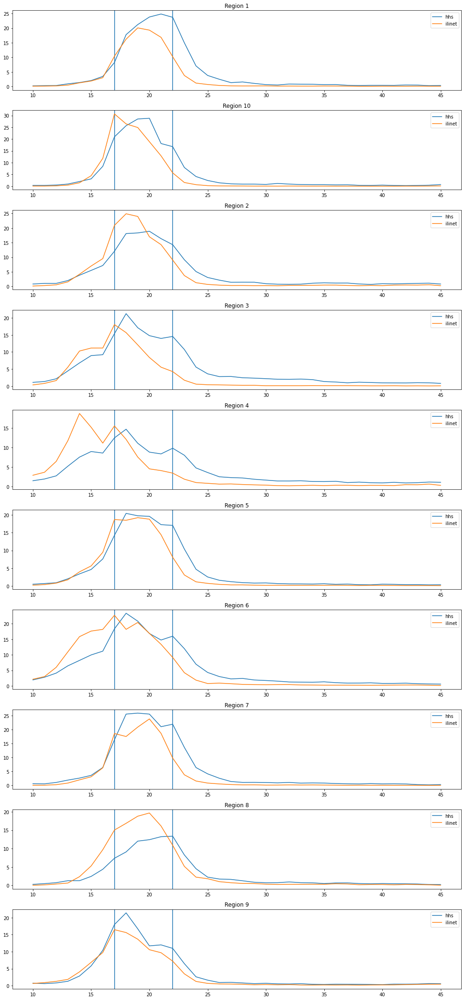

In [38]:
n_locations = len(hhs_agg_to_hhs['location'].unique())

fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(hhs_agg_to_hhs['location'].unique()):
    location_dat = hhs_agg_to_hhs.loc[hhs_agg_to_hhs['location'] == location]
    location_dat.loc[(location_dat['season_week'] < 10) |
                   (location_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(location_dat['season_week'], location_dat['inc']*2.5, label = 'hhs')

    hol = holiday_cal.holidays(
        start=location_dat.wk_end_date.min(),
        end=location_dat.wk_end_date.max(),
        return_name=True)
    
    for hol_name in ['Thanksgiving', 'Christmas']:
        hol_date = hol[hol == hol_name].index[0]
        hol_week = location_dat.loc[location_dat['wk_end_date'] >= hol_date].head(1)['season_week'].values[0]
        ax[i].axvline(hol_week)

    # location_dat = flusurv_agg_to_hhs.loc[(flusurv_agg_to_hhs['location'] == location) &
    #                                     (flusurv_agg_to_hhs['season'] == '2022/23')]
    # location_dat.loc[(location_dat['season_week'] < 10) |
    #                (location_dat['season_week'] > 45), 'inc'] = np.nan
    # ax[i].plot(location_dat['season_week'], location_dat['inc'], label = 'flusurv')
    
    location_dat = ilinet_dat \
        .loc[(ilinet_dat['location'] == location) &
             (ilinet_dat['season'] == '2022/23')]
    location_dat.loc[(location_dat['season_week'] < 10) |
                   (location_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(location_dat['season_week'], location_dat['inc']*10, label = 'ilinet')
    

    ax[i].set_title(location)
    ax[i].legend()

fig.tight_layout()


In [39]:
hhs_dat

,agg_level,location,season,season_week,wk_end_date,inc,source,abbreviation,location_name,hhs_region
0,state,01,2022/23,5,2022-09-03,0.413851,hhs,AL,Alabama,4.0
1,state,01,2022/23,6,2022-09-10,0.216779,hhs,AL,Alabama,4.0
2,state,01,2022/23,7,2022-09-17,0.335022,hhs,AL,Alabama,4.0
3,state,01,2022/23,8,2022-09-24,0.394143,hhs,AL,Alabama,4.0
4,state,01,2022/23,9,2022-10-01,0.472972,hhs,AL,Alabama,4.0
...,...,...,...,...,...,...,...,...,...,...
2961,national,US,2023/24,2,2023-08-12,NaN,hhs,US,United States,NaN
2962,national,US,2023/24,3,2023-08-19,NaN,hhs,US,United States,NaN
2963,national,US,2023/24,4,2023-08-26,NaN,hhs,US,United States,NaN
2964,national,US,2023/24,5,2023-09-02,NaN,hhs,US,United States,NaN


In [40]:
ilinet_dat.merge(
    fips_mappings.rename(columns={'location': 'fips'}),
    left_on = 'location',
    right_on = 'location_name')

,agg_level,location,season,season_week,wk_end_date,inc,source,abbreviation,fips,location_name,hhs_region
0,state,Alabama,2010/11,10,2010-10-09,0.000000,ilinet,AL,01,Alabama,4.0
1,state,Alabama,2010/11,11,2010-10-16,0.000000,ilinet,AL,01,Alabama,4.0
2,state,Alabama,2010/11,12,2010-10-23,0.035349,ilinet,AL,01,Alabama,4.0
3,state,Alabama,2010/11,13,2010-10-30,0.177795,ilinet,AL,01,Alabama,4.0
4,state,Alabama,2010/11,14,2010-11-06,0.451693,ilinet,AL,01,Alabama,4.0
...,...,...,...,...,...,...,...,...,...,...,...
35668,state,Puerto Rico,2023/24,4,2023-08-26,0.000000,ilinet,PR,72,Puerto Rico,2.0
35669,state,Puerto Rico,2023/24,5,2023-09-02,0.000000,ilinet,PR,72,Puerto Rico,2.0
35670,state,Puerto Rico,2023/24,6,2023-09-09,0.000000,ilinet,PR,72,Puerto Rico,2.0
35671,state,Puerto Rico,2023/24,7,2023-09-16,0.000000,ilinet,PR,72,Puerto Rico,2.0


In [45]:
flusurv_agg_to_state = flusurv_dat \
    .loc[flusurv_dat['location'] != 'Entire Network'] \
    .assign(state = lambda x: np.where(x['location'].isin(['New York - Albany', 'New York - Rochester']),
                                       'New York',
                                       x['location'])) \
    .merge(
        fips_mappings.rename(columns={'location': 'fips'}),
        left_on='state',
        right_on='location_name') \
    .merge(
        load_us_census(),
        left_on = ['fips', 'season'],
        right_on = ['location', 'season'],
        how='left') \
    .groupby(['state', 'fips', 'season', 'season_week', 'wk_end_date', 'source']) \
    .apply(lambda x: pd.DataFrame({'inc': [np.sum(x['inc'] * x['pop']) / np.sum(x['pop'])]})) \
    .reset_index() \
    .drop(columns = 'level_6') \
    .rename(columns = {'fips': 'location'})

flusurv_agg_to_state


,state,location,season,season_week,wk_end_date,source,inc
0,California,06,2010/11,10.0,2010-10-09,flusurvnet,0.432044
1,California,06,2010/11,11.0,2010-10-16,flusurvnet,0.432044
2,California,06,2010/11,12.0,2010-10-23,flusurvnet,0.000000
3,California,06,2010/11,13.0,2010-10-30,flusurvnet,0.432044
4,California,06,2010/11,14.0,2010-11-06,flusurvnet,0.000000
...,...,...,...,...,...,...,...
4298,Utah,49,2022/23,35.0,2023-04-01,flusurvnet,0.000000
4299,Utah,49,2022/23,36.0,2023-04-08,flusurvnet,0.685190
4300,Utah,49,2022/23,37.0,2023-04-15,flusurvnet,0.685190
4301,Utah,49,2022/23,38.0,2023-04-22,flusurvnet,0.913587


/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

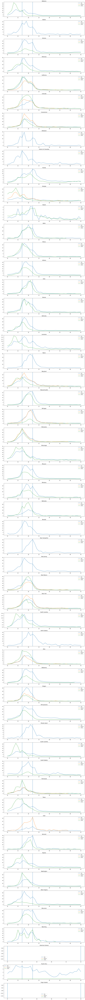

In [46]:
hhs_dat_state = hhs_dat.query('agg_level == "state"')
ilinet_dat_w_fips = ilinet_dat.merge(
    fips_mappings.rename(columns={'location': 'fips'}),
    left_on = 'location',
    right_on = 'location_name')

n_locations = len(hhs_dat_state['location'].unique())

fig, ax = plt.subplots(n_locations, 1, figsize = (14, 3*n_locations))

for i, location in enumerate(hhs_dat_state['location'].unique()):
    location_dat = hhs_dat_state.loc[hhs_dat_state['location'] == location]
    location_dat.loc[(location_dat['season_week'] < 10) |
                   (location_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(location_dat['season_week'], location_dat['inc']*2.5, label = 'hhs')

    hol = holiday_cal.holidays(
        start=location_dat.wk_end_date.min(),
        end=location_dat.wk_end_date.max(),
        return_name=True)
    
    for hol_name in ['Thanksgiving', 'Christmas']:
        hol_date = hol[hol == hol_name].index[0]
        hol_week = location_dat.loc[location_dat['wk_end_date'] >= hol_date].head(1)['season_week'].values[0]
        ax[i].axvline(hol_week)

    location_dat = flusurv_agg_to_state.loc[(flusurv_agg_to_state['location'] == location) &
                                        (flusurv_agg_to_state['season'] == '2022/23')]
    location_dat.loc[(location_dat['season_week'] < 10) |
                   (location_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(location_dat['season_week'], location_dat['inc'], label = 'flusurv')
    
    location_dat = ilinet_dat_w_fips \
        .loc[(ilinet_dat_w_fips['fips'] == location) &
             (ilinet_dat_w_fips['season'] == '2022/23')]
    location_dat.loc[(location_dat['season_week'] < 10) |
                   (location_dat['season_week'] > 45), 'inc'] = np.nan
    ax[i].plot(location_dat['season_week'], location_dat['inc']*10, label = 'ilinet')
    

    ax[i].set_title(fips_mappings.loc[fips_mappings['location'] == location, 'location_name'].values[0])
    ax[i].legend()

fig.tight_layout()


/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

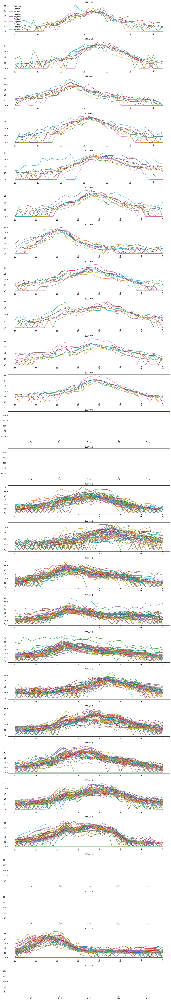

In [45]:
n_seasons = len(ilinet_dat['season'].unique())
fig, ax = plt.subplots(n_seasons, 1, figsize = (14, 3*n_seasons))

for i, season in enumerate(ilinet_dat['season'].unique()):
    season_dat = ilinet_dat.loc[ilinet_dat['season'] == season]
    season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
    
    for j, location in enumerate(season_dat['location'].unique()):
        location_dat = season_dat.loc[season_dat['location'] == location]
        # ax[i].plot(location_dat['season_week'], np.log(location_dat['inc']*10), label = location)
        ax[i].plot(location_dat['season_week'], (location_dat['inc']*10)**0.25, label = location)
        ax[i].set_title(season)

ax[0].legend()
fig.tight_layout()


/usr/local/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

/usr/local/lib/python3.9/site-packag

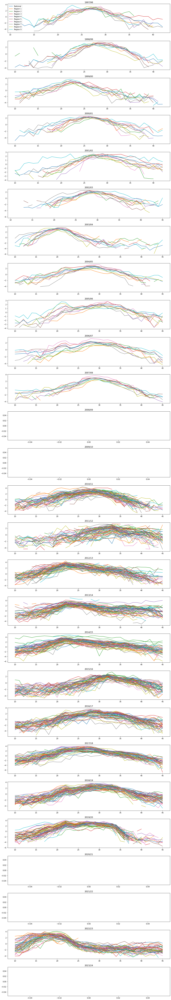

In [46]:
n_seasons = len(ilinet_dat['season'].unique())
fig, ax = plt.subplots(n_seasons, 1, figsize = (14, 3*n_seasons))

for i, season in enumerate(ilinet_dat['season'].unique()):
    season_dat = ilinet_dat.loc[ilinet_dat['season'] == season]
    season_dat.loc[(season_dat['season_week'] < 10) | (season_dat['season_week'] > 45), 'inc'] = np.nan
    
    for j, location in enumerate(season_dat['location'].unique()):
        location_dat = season_dat.loc[season_dat['location'] == location]
        ax[i].plot(location_dat['season_week'], np.log(location_dat['inc']*10), label = location)
        # ax[i].plot(location_dat['season_week'], (location_dat['inc']*10)**0.25, label = location)
        ax[i].set_title(season)

ax[0].legend()
fig.tight_layout()


In [42]:
hhs_dat = hhs_dat.merge(
    load_us_census(),
    on=['season', 'location'],
    how='left') \
    .assign(log_pop = lambda x: np.log(x['pop']))

In [43]:
hhs_dat

,agg_level,location,season,season_week,wk_end_date,inc,source,abbreviation,location_name,hhs_region,pop,log_pop
0,state,01,2022/23,5,2022-09-03,0.413851,hhs,AL,Alabama,4.0,5074296.0,15.439698
1,state,01,2022/23,6,2022-09-10,0.216779,hhs,AL,Alabama,4.0,5074296.0,15.439698
2,state,01,2022/23,7,2022-09-17,0.335022,hhs,AL,Alabama,4.0,5074296.0,15.439698
3,state,01,2022/23,8,2022-09-24,0.394143,hhs,AL,Alabama,4.0,5074296.0,15.439698
4,state,01,2022/23,9,2022-10-01,0.472972,hhs,AL,Alabama,4.0,5074296.0,15.439698
...,...,...,...,...,...,...,...,...,...,...,...,...
2961,national,US,2023/24,2,2023-08-12,NaN,hhs,US,United States,NaN,NaN,NaN
2962,national,US,2023/24,3,2023-08-19,NaN,hhs,US,United States,NaN,NaN,NaN
2963,national,US,2023/24,4,2023-08-26,NaN,hhs,US,United States,NaN,NaN,NaN
2964,national,US,2023/24,5,2023-09-02,NaN,hhs,US,United States,NaN,NaN,NaN


<AxesSubplot:xlabel='season_week', ylabel='inc'>

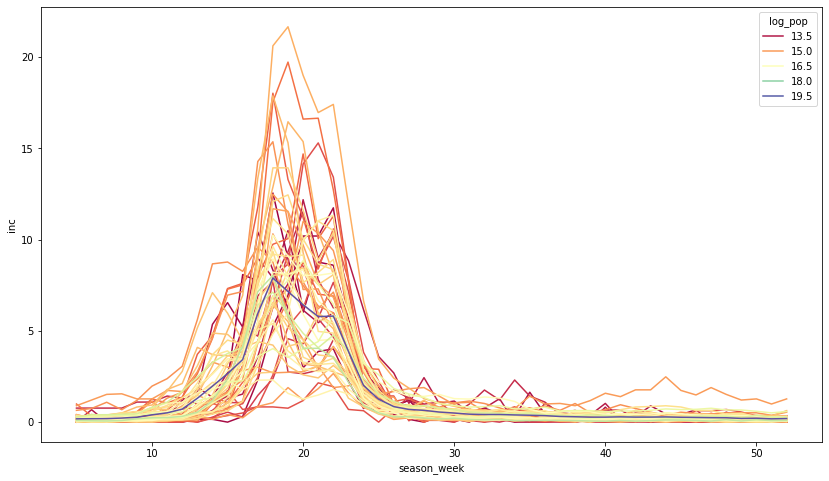

In [44]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 8)
# sns.set_palette("PuBuGn_d")

sns.lineplot(data=hhs_dat, x='season_week', y='inc', hue='log_pop', ax=ax,
             palette = 'Spectral')

# for j, region in enumerate(hhs_dat['region'].unique()):
#     region_dat = hhs_dat.loc[hhs_dat['region'] == region]
#     region_dat.loc[(region_dat['season_week'] < 10) | (region_dat['season_week'] > 45), 'inc'] = np.nan
#     plt.plot(region_dat['season_week'],
#              (region_dat['inc']*2.5)**0.25,
#              col=region_dat['log_pop'],
#              label = region)
